In [1]:
import pandas as pd
import numpy as np
import pandas_profiling
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import datetime

In [2]:
# Create Data audit Report for continuous variables
def continuous_var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  
                      x.std(), x.var(), x.min(), x.quantile(0.01), x.quantile(0.05),
                          x.quantile(0.10),x.quantile(0.25),x.quantile(0.50),x.quantile(0.75), 
                              x.quantile(0.90),x.quantile(0.95), x.quantile(0.99),x.max()], 
                  index = ['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1', 
                               'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])


In [3]:
# Create Data audit Report for categorical variables
def categorical_var_summary(x):
    Mode = x.value_counts().sort_values(ascending = False)[0:1].reset_index()
    return pd.Series([x.count(), x.isnull().sum(), Mode.iloc[0, 0], Mode.iloc[0, 1], 
                          round(Mode.iloc[0, 1] * 100/x.count(), 2)], 
                  index = ['N', 'NMISS', 'MODE', 'FREQ', 'PERCENT'])


In [4]:
# Missing value imputation for categorical and continuous variables
def missing_imputation(x, stats = 'mean'):
    if (x.dtypes == 'float64') | (x.dtypes == 'int64'):
        x = x.fillna(x.mean()) if stats == 'mean' else x.fillna(x.median())
    else:
        x = x.fillna(x.mode())
    return x

In [5]:
test = pd.read_csv("C://Users//Purva//Desktop//DS Final projects//2. Walmart Store Sales Forecasting//data//test.csv")
train = pd.read_csv("C://Users//Purva//Desktop//DS Final projects//2. Walmart Store Sales Forecasting//data//train.csv")
features = pd.read_csv("C://Users//Purva//Desktop//DS Final projects//2. Walmart Store Sales Forecasting//data//features.csv")
stores = pd.read_csv("C://Users//Purva//Desktop//DS Final projects//2. Walmart Store Sales Forecasting//data//stores.csv")

In [6]:
new_data = pd.merge(features, train, on=['Store','Date','IsHoliday'], how='inner').sort_values(by = ['Store', 'Date','IsHoliday'])

In [7]:
final_data = pd.merge(new_data,stores,how='inner',on=['Store']).reset_index(drop = True)

In [8]:
final_data.head(2)

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Dept,Weekly_Sales,Type,Size
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,1,24924.50,A,151315
1,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,2,50605.27,A,151315


In [9]:
pandas_profiling.ProfileReport(final_data)

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
final_data.shape

(421570, 16)

### Splitting Date into features

In [11]:
# Add column for year

final_data["Year"] = pd.to_datetime(final_data["Date"], format="%Y-%m-%d").dt.year

# Add column for day
final_data["Day"] = pd.to_datetime(final_data["Date"], format="%Y-%m-%d").dt.day

# Add column for days to next Christmas
final_data["Days_to_Next_Christmas"] = (pd.to_datetime(final_data["Year"].astype(str)+"-12-31", format="%Y-%m-%d") -
                                   pd.to_datetime(final_data["Date"], format="%Y-%m-%d")).dt.days.astype(int)



In [12]:
final_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 19 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Store                   421570 non-null  int64  
 1   Date                    421570 non-null  object 
 2   Temperature             421570 non-null  float64
 3   Fuel_Price              421570 non-null  float64
 4   MarkDown1               150681 non-null  float64
 5   MarkDown2               111248 non-null  float64
 6   MarkDown3               137091 non-null  float64
 7   MarkDown4               134967 non-null  float64
 8   MarkDown5               151432 non-null  float64
 9   CPI                     421570 non-null  float64
 10  Unemployment            421570 non-null  float64
 11  IsHoliday               421570 non-null  bool   
 12  Dept                    421570 non-null  int64  
 13  Weekly_Sales            421570 non-null  float64
 14  Type                

In [13]:
final_data.columns

Index(['Store', 'Date', 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2',
       'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment',
       'IsHoliday', 'Dept', 'Weekly_Sales', 'Type', 'Size', 'Year', 'Day',
       'Days_to_Next_Christmas'],
      dtype='object')

In [14]:
final_data['Date'] = pd.to_datetime(final_data.Date)

In [15]:
# defining categorical variables

for x in ['Type','IsHoliday']:
    final_data[x] = final_data[x].astype('object')

In [16]:
# separation of continuous variables and categorical variables

conti_vars=final_data.select_dtypes(['float64','int64','int32'])
cat_vars=final_data.select_dtypes('object')
conti_vars.head()

,Store,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Dept,Weekly_Sales,Size,Year,Day,Days_to_Next_Christmas
0,1,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,1,24924.50,151315,2010,5,329
1,1,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,2,50605.27,151315,2010,5,329
2,1,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,3,13740.12,151315,2010,5,329
3,1,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,4,39954.04,151315,2010,5,329
4,1,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,5,32229.38,151315,2010,5,329


In [17]:
cat_vars.head()

,IsHoliday,Type
0,False,A
1,False,A
2,False,A
3,False,A
4,False,A


In [18]:
final_data.isna().sum()

Store                          0
Date                           0
Temperature                    0
Fuel_Price                     0
MarkDown1                 270889
MarkDown2                 310322
MarkDown3                 284479
MarkDown4                 286603
MarkDown5                 270138
CPI                            0
Unemployment                   0
IsHoliday                      0
Dept                           0
Weekly_Sales                   0
Type                           0
Size                           0
Year                           0
Day                            0
Days_to_Next_Christmas         0
dtype: int64

In [19]:
# separation of continuous variables and categorical variables

conti_vars=final_data.select_dtypes(['float64','int64','int32'])
cat_vars=final_data.select_dtypes(['object','bool'])
conti_vars.head()

,Store,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Dept,Weekly_Sales,Size,Year,Day,Days_to_Next_Christmas
0,1,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,1,24924.50,151315,2010,5,329
1,1,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,2,50605.27,151315,2010,5,329
2,1,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,3,13740.12,151315,2010,5,329
3,1,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,4,39954.04,151315,2010,5,329
4,1,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,5,32229.38,151315,2010,5,329


In [20]:
# summary of continuous variables
conti_vars.apply(continuous_var_summary).T.round(1).sort_values('NMISS',ascending=False).head(10)

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
MarkDown2,111248.0,310322.0,3.709708e+08,3334.6,192.0,9475.4,89782396.4,-265.8,-1.0,2.0,7.0,41.6,192.0,1926.9,8549.7,16497.5,50366.6,104519.5
MarkDown4,134967.0,286603.0,4.566161e+08,3383.2,1481.3,6292.4,39594096.8,0.2,4.0,28.8,108.7,504.2,1481.3,3595.0,7871.4,12646.0,35785.3,67474.8
MarkDown3,137091.0,284479.0,1.973317e+08,1439.4,24.6,9623.1,92603635.8,-29.1,0.1,0.6,1.6,5.1,24.6,104.0,400.1,1059.9,63143.3,141630.6
MarkDown1,150681.0,270889.0,1.091898e+09,7246.4,5347.4,8291.2,68744351.4,0.3,17.8,149.2,375.2,2240.3,5347.4,9210.9,15282.5,21801.4,41524.0,88646.8
MarkDown5,151432.0,270138.0,7.009750e+08,4629.0,3359.4,5962.9,35556026.8,135.2,352.0,715.5,1070.8,1878.4,3359.4,5563.8,8337.7,11269.2,27754.2,108519.3
Store,421570.0,0.0,9.359084e+06,22.2,22.0,12.8,163.5,1.0,1.0,3.0,5.0,11.0,22.0,33.0,40.0,43.0,45.0,45.0
Temperature,421570.0,0.0,2.533217e+07,60.1,62.1,18.4,340.3,-2.1,18.3,27.3,34.0,46.7,62.1,74.3,83.6,87.3,92.8,100.1
Fuel_Price,421570.0,0.0,1.416908e+06,3.4,3.5,0.5,0.2,2.5,2.6,2.7,2.7,2.9,3.5,3.7,3.9,4.0,4.2,4.5
CPI,421570.0,0.0,7.217360e+07,171.2,182.3,39.2,1533.4,126.1,126.1,126.5,128.8,132.0,182.3,212.4,219.4,221.9,225.5,227.2
Unemployment,421570.0,0.0,3.355819e+06,8.0,7.9,1.9,3.5,3.9,4.2,5.3,6.0,6.9,7.9,8.6,9.8,12.2,14.2,14.3


### Outlier treatment

In [21]:
# continuous variables
conti_vars = conti_vars.apply(lambda x: x.clip(lower = x.quantile(0.01), upper = x.quantile(0.99)))

In [22]:
conti_vars.apply(continuous_var_summary).T.round(2)

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
Store,421570.0,0.0,9.359084e+06,22.20,22.00,12.79,1.634600e+02,1.00,1.00,3.00,5.00,11.00,22.00,33.00,40.00,43.00,45.00,45.00
Temperature,421570.0,0.0,2.533977e+07,60.11,62.09,18.30,3.347900e+02,18.30,18.30,27.31,33.98,46.68,62.09,74.28,83.58,87.27,92.81,92.81
Fuel_Price,421570.0,0.0,1.416587e+06,3.36,3.45,0.46,2.100000e-01,2.56,2.56,2.65,2.72,2.93,3.45,3.74,3.92,4.03,4.20,4.20
MarkDown1,150681.0,270889.0,1.069989e+09,7101.02,5347.45,7421.35,5.507651e+07,17.76,17.76,149.19,375.20,2240.27,5347.45,9210.90,15282.47,21801.35,41524.03,41524.03
MarkDown2,111248.0,310322.0,3.498977e+08,3145.20,192.00,8059.58,6.495681e+07,-0.99,-0.99,1.95,6.98,41.60,192.00,1926.94,8549.74,16497.47,50366.60,50366.60
MarkDown3,137091.0,284479.0,1.690173e+08,1232.88,24.60,7696.88,5.924192e+07,0.06,0.06,0.65,1.65,5.08,24.60,103.99,400.09,1059.90,63143.29,63143.29
MarkDown4,134967.0,286603.0,4.408980e+08,3266.71,1481.31,5486.60,3.010277e+07,3.97,3.97,28.76,108.71,504.22,1481.31,3595.04,7871.42,12645.96,35785.26,35785.26
MarkDown5,151432.0,270138.0,6.733077e+08,4446.27,3359.45,4232.21,1.791161e+07,351.97,351.97,715.52,1070.83,1878.44,3359.45,5563.80,8337.70,11269.24,27754.23,27754.23
CPI,421570.0,0.0,7.217089e+07,171.20,182.32,39.15,1.532690e+03,126.11,126.11,126.50,128.82,132.02,182.32,212.42,219.44,221.94,225.47,225.47
Unemployment,421570.0,0.0,3.355685e+06,7.96,7.87,1.86,3.460000e+00,4.16,4.16,5.33,5.96,6.89,7.87,8.57,9.82,12.19,14.18,14.18


###  Missing value imputations

In [23]:
#for categorical and continuous variables
conti_vars = conti_vars.apply(missing_imputation)
cat_vars = cat_vars.apply(missing_imputation)

In [24]:
conti_vars.apply(continuous_var_summary).T.round(1)
cat_vars.apply(categorical_var_summary).T.round(1)

,N,NMISS,MODE,FREQ,PERCENT
IsHoliday,421570,0,False,391909,92.96
Type,421570,0,A,215478,51.11


### Dummy creation

In [25]:
tp = pd.get_dummies(cat_vars.Type)
cat_var_d = pd.concat([cat_vars, tp], axis=1)
cat_var_d =cat_var_d.drop(columns='Type')

In [26]:
cat_var_d

,IsHoliday,A,B,C
0,False,1,0,0
1,False,1,0,0
2,False,1,0,0
3,False,1,0,0
4,False,1,0,0
...,...,...,...,...
421565,False,0,1,0
421566,False,0,1,0
421567,False,0,1,0
421568,False,0,1,0


In [27]:
# Final dataset

final = pd.concat([conti_vars, cat_var_d], axis = 1)
final.head(2)

,Store,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Dept,Weekly_Sales,Size,Year,Day,Days_to_Next_Christmas,IsHoliday,A,B,C
0,1,42.31,2.572,7101.024615,3145.204726,1232.884198,3266.709525,4446.270931,211.096358,8.106,1,24924.50,151315,2010,5,329,False,1,0,0
1,1,42.31,2.572,7101.024615,3145.204726,1232.884198,3266.709525,4446.270931,211.096358,8.106,2,50605.27,151315,2010,5,329,False,1,0,0


### Check assumption for LR

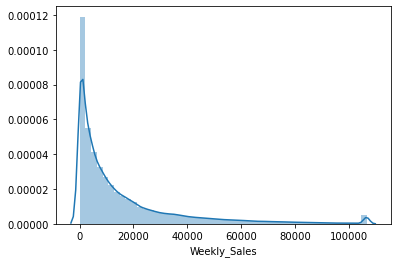

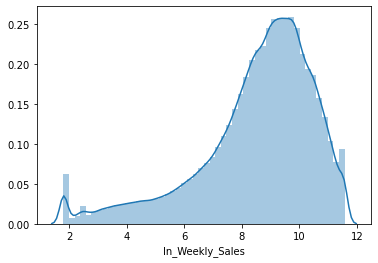

In [28]:
sns.distplot(final.Weekly_Sales)
plt.show()
final['ln_Weekly_Sales']=np.log(final['Weekly_Sales']+1)
sns.distplot(final.ln_Weekly_Sales)
plt.show()


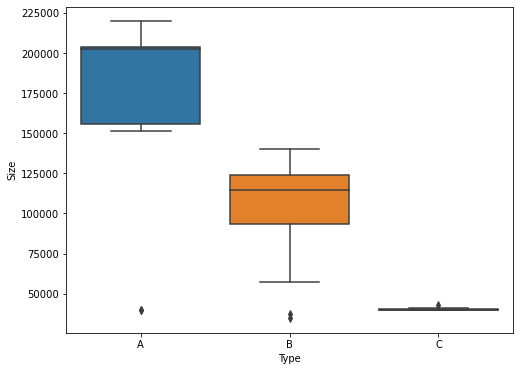

In [29]:
# boxplot for sizes of types of stores

store_type = pd.concat([stores['Type'], stores['Size']], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Type', y='Size', data=store_type)

- By boxplot we can say that type A store is the largest store and type C is the smallest store.
- There is no overlapping between A,B,C.


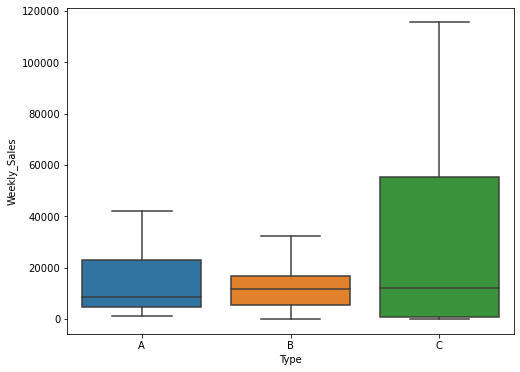

In [30]:
store_sale = pd.concat([stores['Type'], final_data['Weekly_Sales']], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Type', y='Weekly_Sales', data=store_sale, showfliers=False)

- The median of A is the highest and C is the lowest i.e stores with more sizes have higher sales.

In [31]:
# total count of sales on holidays and non holidays

print('sales on non-holiday : ',final_data[final_data['IsHoliday']==False]['Weekly_Sales'].count().round(1))
print('sales on holiday : ',final_data[final_data['IsHoliday']==True]['Weekly_Sales'].count().round(1))

sales on non-holiday :  391909
sales on holiday :  29661


#### Correlation among features

[]

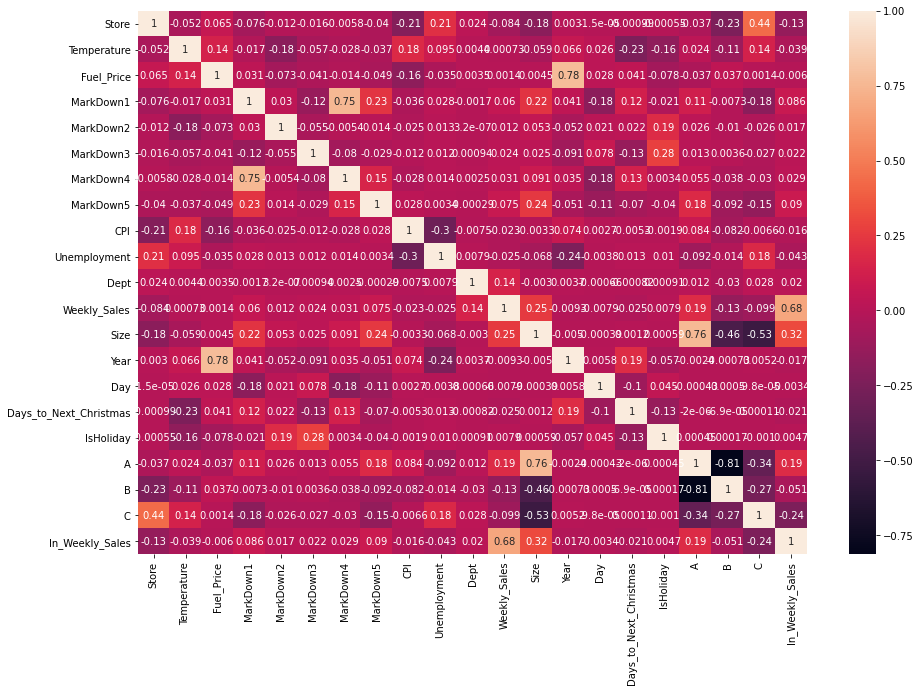

In [32]:
# Plotting correlation between all important features
corr = final.corr()
plt.figure(figsize=(15, 10))
sns.heatmap(corr, annot=True)
plt.plot()

In [33]:
final.isna().sum()

Store                     0
Temperature               0
Fuel_Price                0
MarkDown1                 0
MarkDown2                 0
MarkDown3                 0
MarkDown4                 0
MarkDown5                 0
CPI                       0
Unemployment              0
Dept                      0
Weekly_Sales              0
Size                      0
Year                      0
Day                       0
Days_to_Next_Christmas    0
IsHoliday                 0
A                         0
B                         0
C                         0
ln_Weekly_Sales           0
dtype: int64

### Splitting data into train and test

In [34]:
#train-test split
from sklearn.model_selection import train_test_split
train,test =train_test_split(final, test_size=0.3, random_state=0)

In [35]:
print("The no. of rows in the train dataset are",len(train))
print("The no. of rows in the test dataset are",len(test))
print("The no. of rows in the original dataset are",len(final_data))

The no. of rows in the train dataset are 295099
The no. of rows in the test dataset are 126471
The no. of rows in the original dataset are 421570


In [36]:
train.columns= [phrase.strip().replace('-', '') for phrase in train.columns]
train.columns

Index(['Store', 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2',
       'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment', 'Dept',
       'Weekly_Sales', 'Size', 'Year', 'Day', 'Days_to_Next_Christmas',
       'IsHoliday', 'A', 'B', 'C', 'ln_Weekly_Sales'],
      dtype='object')

In [37]:
all_columns = "+".join(train.columns.difference( ['ln_Weekly_Sales'] ))

print(all_columns)


A+B+C+CPI+Day+Days_to_Next_Christmas+Dept+Fuel_Price+IsHoliday+MarkDown1+MarkDown2+MarkDown3+MarkDown4+MarkDown5+Size+Store+Temperature+Unemployment+Weekly_Sales+Year


## OLS Model using Linear Regression¶

In [38]:
import statsmodels.formula.api as smf                # #simultaneously reducing least contributing variables as per p value

lm=smf.ols('''ln_Weekly_Sales ~A+B+C+CPI+Day+Days_to_Next_Christmas+Dept+Fuel_Price+IsHoliday+MarkDown1+MarkDown2+MarkDown3+MarkDown4+MarkDown5+Size+Store+Temperature+Unemployment+Year
''',train).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        ln_Weekly_Sales   R-squared:                       0.114
Model:                            OLS   Adj. R-squared:                  0.114
Method:                 Least Squares   F-statistic:                     2116.
Date:                Thu, 23 Dec 2021   Prob (F-statistic):               0.00
Time:                        19:11:46   Log-Likelihood:            -6.1016e+05
No. Observations:              295099   AIC:                         1.220e+06
Df Residuals:                  295080   BIC:                         1.221e+06
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                 39.6416     12.293      3.225      0.001      15.547      63.736
IsHoliday[T.True]         -0.0168      0.015     -1.121      0.262      -0.046       0.013
A                         13.0932      4.098      3.195      0.001       5.062      21.125
B                         13.4663      4.097      3.287      0.001       5.436      21.497
C                         13.0821      4.098      3.192      0.001       5.050      21.114
CPI                       -0.0011      0.000    -10.480      0.000      -0.001      -0.001
Day                       -0.0009      0.000     -2.146      0.032      -0.002   -7.69e-05
Days_to_Next_Christmas    -0.0005   3.95e-05    -11.568      0.000      -0.001      -0.000
Dept                       0.0017      0.000     14.518      0.000       0.001       0.002
Fuel_Price                -0.0126      0.014     -0.895      0.371      -0.040       0.015
MarkDown1                5.58e-06   1.29e-06      4.335      0.000    3.06e-06     8.1e-06
MarkDown2                -1.6e-06   8.92e-07     -1.795      0.073   -3.35e-06    1.47e-07
MarkDown3               4.331e-06   8.59e-07      5.044      0.000    2.65e-06    6.01e-06
MarkDown4              -3.923e-06   1.78e-06     -2.209      0.027    -7.4e-06   -4.42e-07
MarkDown5               6.104e-06   1.48e-06      4.129      0.000    3.21e-06       9e-06
Size                    1.134e-05   1.03e-07    109.938      0.000    1.11e-05    1.15e-05
Store                     -0.0083      0.000    -25.490      0.000      -0.009      -0.008
Temperature               -0.0012      0.000     -5.384      0.000      -0.002      -0.001
Unemployment              -0.0161      0.002     -7.438      0.000      -0.020      -0.012
Year                      -0.0225      0.008     -2.759      0.006      -0.039      -0.007
==============================================================================
Omnibus:                    50225.114   Durbin-Watson:                   2.003
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            90085.591
Skew:                          -1.091   Prob(JB):                         0.00
Kurtosis:                       4.602   Cond. No.                     7.26e+17
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.26e-20. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

### VIF (Variance Inflation Factor): Check the multicollinieirity for all the variables in the model

In [39]:
model_param='''ln_Weekly_Sales ~A+B+C+CPI+Day+Days_to_Next_Christmas+Dept+Fuel_Price+IsHoliday+MarkDown1+MarkDown2+MarkDown3+MarkDown4+MarkDown5+Size+Store+Temperature+Unemployment+Year
'''
# import the packages for vif
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices

# separate the Y and X variables
y, X = dmatrices(model_param, train, return_type = 'dataframe')

# For each X, calculate VIF and save in dataframe
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF Factor'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# display the output
vif.round(1)

C:\Users\Purva\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1685: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\Purva\anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:193: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


,Features,VIF Factor
0,Intercept,0.0
1,IsHoliday[T.True],1.2
2,A,inf
3,B,inf
4,C,inf
5,CPI,1.4
6,Day,1.1
7,Days_to_Next_Christmas,1.2
8,Dept,1.0
9,Fuel_Price,3.3


In [40]:
#predict the sales on the training data

train['pred_limit'] = np.exp(lm.predict(train))
train.head()

<ipython-input-40-1e57822da11d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['pred_limit'] = np.exp(lm.predict(train))


,Store,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,...,Size,Year,Day,Days_to_Next_Christmas,IsHoliday,A,B,C,ln_Weekly_Sales,pred_limit
421230,45,65.32,4.038,8452.200000,92.280000,63.240000,2376.380000,8670.400000,191.856704,8.684,...,118221,2012,21,101,False,0,1,0,9.682492,4506.483899
277451,29,43.43,2.805,7101.024615,3145.204726,1232.884198,3266.709525,4446.270931,131.784000,10.064,...,93638,2010,12,294,False,0,1,0,7.346236,3569.502513
406157,44,76.34,2.850,7101.024615,3145.204726,1232.884198,3266.709525,4446.270931,126.111903,7.804,...,39910,2010,20,133,False,0,0,1,4.970022,1311.241258
38797,4,81.06,3.356,7011.680000,68.700000,4.260000,13565.830000,3841.610000,130.719581,4.156,...,205863,2012,27,157,False,1,0,0,9.674018,10584.743135
136728,14,71.93,3.620,10737.660000,423.400000,5.060000,1904.520000,3823.070000,191.029973,8.567,...,200898,2012,15,199,False,1,0,0,8.625732,8493.958435


In [41]:
#predict the sales on the testing/validation data
test['pred_limit'] = np.exp(lm.predict(test))
test.head()

<ipython-input-41-6272f4b15418>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['pred_limit'] = np.exp(lm.predict(test))


,Store,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,...,Size,Year,Day,Days_to_Next_Christmas,IsHoliday,A,B,C,ln_Weekly_Sales,pred_limit
233571,24,48.17,3.717,9025.520000,794.020000,198.980000,2629.750000,5364.550000,136.466667,8.454,...,203819,2011,18,43,False,1,0,0,7.967786,10869.797121
88992,10,83.49,2.935,7101.024615,3145.204726,1232.884198,3266.709525,4446.270931,126.114000,9.524,...,126512,2010,18,196,False,0,1,0,11.442023,6789.659693
367842,39,58.58,3.159,873.380000,15.150000,505.720000,650.860000,6904.190000,217.878134,7.716,...,184109,2011,16,15,False,1,0,0,9.037537,7032.572421
184359,19,37.08,3.666,3504.090000,11505.420000,291.370000,1698.880000,5451.320000,136.753000,7.943,...,203819,2012,13,353,False,1,0,0,10.623704,8248.523923
26175,3,71.04,3.372,7101.024615,3145.204726,1232.884198,3266.709525,4446.270931,221.080184,7.197,...,37392,2011,28,64,False,0,1,0,7.053396,2301.225226


In [42]:
# accuracy metrics (d. Decile Analysis: for validation of models - Business validation)
# create the 10 groups in the data
train['Deciles'] = pd.qcut(train['pred_limit'], 10, labels = False)
test['Deciles'] = pd.qcut(test['pred_limit'], 10, labels = False)

# Decile Analysis for train data
Predicted_avg = train[['Deciles', 'pred_limit']].groupby(train.Deciles).mean().sort_index(ascending = False)['pred_limit']
Actual_avg = train[['Deciles', 'ln_Weekly_Sales']].groupby(train.Deciles).mean().sort_index(ascending = False)['ln_Weekly_Sales']
Decile_analysis_train = pd.concat([Predicted_avg, Actual_avg], axis = 1).reset_index()

# Decile Analysis for test data
Predicted_avg = test[['Deciles', 'pred_limit']].groupby(test.Deciles).mean().sort_index(ascending = False)['pred_limit']
Actual_avg = test[['Deciles', 'ln_Weekly_Sales']].groupby(test.Deciles).mean().sort_index(ascending = False)['ln_Weekly_Sales']
Decile_analysis_test = pd.concat([Predicted_avg, Actual_avg], axis = 1).reset_index()

# write the data into the file
Decile_analysis_train.to_csv('Decile_analysis_train.csv')
Decile_analysis_test.to_csv('Decile_analysis_test.csv')

<ipython-input-42-6402be2efd43>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['Deciles'] = pd.qcut(train['pred_limit'], 10, labels = False)
<ipython-input-42-6402be2efd43>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Deciles'] = pd.qcut(test['pred_limit'], 10, labels = False)


In [43]:
Decile_analysis_train

,Deciles,pred_limit,ln_Weekly_Sales
0,9,11613.785049,9.412786
1,8,9598.030712,9.072239
2,7,8549.526493,8.991866
3,6,6870.554177,8.734790
4,5,5876.221813,8.625765
5,4,5385.945488,8.652430
6,3,4846.647444,8.642011
7,2,3805.013145,8.308064
8,1,2074.385737,7.825497
9,0,1156.431040,6.788283


In [44]:
Decile_analysis_test

,Deciles,pred_limit,ln_Weekly_Sales
0,9,11645.414458,9.406262
1,8,9611.462879,9.085686
2,7,8551.721054,9.025758
3,6,6872.927072,8.759796
4,5,5877.404654,8.643638
5,4,5385.796177,8.669288
6,3,4843.173277,8.649599
7,2,3791.484182,8.313500
8,1,2069.889640,7.833562
9,0,1156.778344,6.796143


### checking for influential observations

In [ ]:
from statsmodels.formula.api import ols
m = ols('''ln_Weekly_Sales ~A+B+C+CPI+Day+Days_to_Next_Christmas+Dept+Fuel_Price+IsHoliday+MarkDown1+MarkDown2+MarkDown3+MarkDown4+MarkDown5+Size+Store+Temperature+Unemployment+Year
''',train).fit()
infl=m.get_influence()
sm_fr=infl.summary_frame()

sm_fr

In [ ]:
feat = ['Store', 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2',
       'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment', 'Dept',
       'Weekly_Sales', 'Size', 'Year', 'Day', 'Days_to_Next_Christmas',
       'IsHoliday', 'A', 'B', 'C', 'ln_Weekly_Sales']

In [ ]:
cr = final[feat]

In [ ]:
# applying cooks_d for predicting influential variables

cr['cooks']=sm_fr['cooks_d']

In [ ]:
tt=cr[cr['cooks'] < 4/cr.shape[0]]

In [ ]:
final = final[feat]
final.head(2)

In [ ]:
# divide the data into training and testing and separate out Y and X variables 
train,test=train_test_split(tt,test_size=0.3,random_state= 1)

In [ ]:
feature_columns1=final.columns.difference(['IsHoliday','Fuel_Price'])

### OLS MODEL 2

In [ ]:
# Further reduction of variables on the basis of p-value


model2='ln_Weekly_Sales ~ ' + ' + '.join(feature_columns1)
print(model2)

In [ ]:
lm2=smf.ols('''ln_Weekly_Sales ~  A+B+C+CPI+Day+Days_to_Next_Christmas+Dept+MarkDown1+MarkDown2+MarkDown3+MarkDown4+MarkDown5+Size+Store+Temperature+Unemployment+Year''',train).fit()

In [ ]:
print(lm2.summary())

In [ ]:
#predict the sales on the testing/validation data
train['pred_limit'] = np.exp(lm2.predict(train))
train.head()

In [ ]:
#predict the sales on the testing/validation data
test['pred_limit'] = np.exp(lm2.predict(test))
test.head()

In [ ]:
# create the 10 groups in the data
train['Deciles'] = pd.qcut(train['pred_limit'], 6, labels = False)
test['Deciles'] = pd.qcut(test['pred_limit'], 6, labels = False)

# Decile Analysis for train data
Predicted_avg = train[['Deciles', 'pred_limit']].groupby(train.Deciles).mean().sort_index(ascending = False)['pred_limit']
Actual_avg = train[['Deciles', 'ln_Weekly_Sales']].groupby(train.Deciles).mean().sort_index(ascending = False)['ln_Weekly_Sales']
Decile_analysis_train = pd.concat([Predicted_avg, Actual_avg], axis = 1).reset_index()

# Decile Analysis for test data
Predicted_avg = test[['Deciles', 'pred_limit']].groupby(test.Deciles).mean().sort_index(ascending = False)['pred_limit']
Actual_avg = test[['Deciles', 'ln_Weekly_Sales']].groupby(test.Deciles).mean().sort_index(ascending = False)['ln_Weekly_Sales']
Decile_analysis_test = pd.concat([Predicted_avg, Actual_avg], axis = 1).reset_index()

# write the data into the file
Decile_analysis_train.to_csv('Decile_analysis_train.csv')
Decile_analysis_test.to_csv('Decile_analysis_test.csv')

Decile_analysis_train

In [ ]:
Decile_analysis_test

#### Assumption check

In [ ]:
# assumption: Normality of the residuals/error (using distplot)
sns.distplot(lm2.resid)
plt.show()

In [ ]:
# assumption: Normality of the residuals/error (using Q-Q plot)
from scipy import stats
import pylab

stats.probplot(lm2.resid, dist = 'norm', plot = pylab)
pylab.show()

In [ ]:
# assumption: mean of residuals/errors is zero
print(lm2.resid.mean())

In [ ]:
# assumption: residuals/errors of the model should not be correlated with dependant (Y) variable
print(stats.stats.pearsonr(lm2.resid, train.ln_Weekly_Sales))

In [ ]:
lm2.resid.shape

In [ ]:
import seaborn as sns
sns.regplot(x=lm2.resid, y=train.ln_Weekly_Sales)
plt.show()

### Machine Learning Approach

In [ ]:

# method 2: required for machine learning methods available in Sklearn
train_X, test_X, train_y, test_y = train_test_split(tt[final.columns.difference(['ln_Weekly_Sales'])], 
                                            tt['ln_Weekly_Sales'], test_size = 0.3, random_state = 12345


In [ ]:
# Using Random Forest


from sklearn.ensemble import RandomForestRegressor
clf_rf= RandomForestRegressor(n_estimators=100)
clf_rf.fit(train_X, train_y)
y_pred_rf= clf_rf.predict(test_X)
acc_rf = round( clf_rf.score(test_X,test_y) * 100, 2)
print (str(acc_rf) + ' percent')

In [ ]:
train_X.columns

In [ ]:
clf_rf.feature_importances_
list(zip(train_X.columns,clf_rf.feature_importances_ ))

In [ ]:
ce=pd.DataFrame(clf_rf.feature_importances_, train_X.columns)
ce.columns=['Coefficients']
ce.sort_values('Coefficients',ascending=False,inplace=True)
ce['Coefficients']=((ce['Coefficients'])*100).round(2)
ce=ce.head(10)
#ce.to_excel('ce.xlsx')

In [ ]:
cece=ce.head(12)
ce.Coefficients.plot(kind='bar',figsize=(15,10),fontsize=16)
plt.show()